<a href="https://colab.research.google.com/github/thngoc17/Fundamentals-of-AI--Lab-1/blob/main/ABC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **Libraries**



In [ ]:
import numpy as np
import time
import collections
import heapq
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import os
import time
from IPython.display import Image, display

# **ABC by NumPy only**

## Class ABC

### ABC for continous problems

In [ ]:
class ArtificialBeeColony:
    """
    Time Complexity: O(max_iter * colony_size * dim)
    Space Complexity: O(colony_size * dim)
    """

    def __init__(self, obj_function, dim, bounds, colony_size=30,
                 max_iter=1000, limit=100, seed=None):
        """
        Initialize the ABC algorithm.

        Parameters:
        -----------
        obj_function : callable
            Objective function to minimize
        dim : int
            Dimensionality of the problem
        bounds : tuple
            (lower_bound, upper_bound) for all dimensions
        colony_size : int
            Number of food sources (colony_size/2 employed + colony_size/2 onlooker bees)
        max_iter : int
            Maximum number of iterations
        limit : int
            Abandonment limit for scout bees
        seed : int, optional
            Random seed for reproducibility
        """
        self.obj_function = obj_function
        self.dim = dim
        self.lb, self.ub = bounds
        self.colony_size = colony_size
        self.max_iter = max_iter
        self.limit = limit

        if seed is not None:
            np.random.seed(seed)

        # Initialize population and fitness
        self.population = None
        self.fitness = None
        self.trial_counter = None
        self.best_solution = None
        self.best_fitness = None
        self.convergence_curve = []

    def initialize_population(self):
        """Initialize the bee colony population randomly"""
        # Time Complexity: O(colony_size * dim) - for generating random population
        #                  + O(colony_size * dim) - for evaluating fitness
        # Space Complexity: O(colony_size * dim) - for storing population
        self.population = np.random.uniform(
            self.lb, self.ub, (self.colony_size, self.dim)
        )
        self.fitness = np.array([self.obj_function(ind) for ind in self.population])
        self.trial_counter = np.zeros(self.colony_size)

        # Track best solution
        best_idx = np.argmin(self.fitness)
        self.best_solution = self.population[best_idx].copy()
        self.best_fitness = self.fitness[best_idx]

    def calculate_probabilities(self):
        """Calculate selection probabilities for onlooker bees"""
        # Time Complexity: O(colony_size)
        # Space Complexity: O(colony_size)
        # Convert fitness to probability (better fitness = higher probability)
        # Using fitness proportional selection
        fitness_values = self.fitness.copy()

        # Handle negative fitness values
        if np.min(fitness_values) < 0:
            fitness_values = fitness_values + np.abs(np.min(fitness_values))

        # Convert to maximization (smaller is better, so inverse)
        fitness_values = 1.0 / (1.0 + fitness_values)

        # Calculate probabilities
        probabilities = fitness_values / np.sum(fitness_values)
        return probabilities

    def employed_bee_phase(self):
        """Employed bees search around their food sources"""
        # Time Complexity: O(colony_size * dim) - Each bee modifies one dimension
        # Space Complexity: O(dim) - for creating new_solution
        for i in range(self.colony_size):
            # Select random dimension to modify
            j = np.random.randint(0, self.dim)

            # Select random neighbor (different from current)
            k = i
            while k == i:
                k = np.random.randint(0, self.colony_size)

            # Generate new solution
            phi = np.random.uniform(-1, 1)
            new_solution = self.population[i].copy()
            new_solution[j] = self.population[i, j] + phi * (
                self.population[i, j] - self.population[k, j]
            )

            # Apply boundary constraints
            new_solution = np.clip(new_solution, self.lb, self.ub)

            # Evaluate new solution
            new_fitness = self.obj_function(new_solution)

            # Greedy selection
            if new_fitness < self.fitness[i]:
                self.population[i] = new_solution
                self.fitness[i] = new_fitness
                self.trial_counter[i] = 0

                # Update global best
                if new_fitness < self.best_fitness:
                    self.best_solution = new_solution.copy()
                    self.best_fitness = new_fitness
            else:
                self.trial_counter[i] += 1

    def onlooker_bee_phase(self):
        """Onlooker bees select food sources based on probability"""
        # Time Complexity: O(colony_size * dim) - Each bee modifies one dimension
        # Space Complexity: O(colony_size) - for probabilities + O(dim) for new_solution
        probabilities = self.calculate_probabilities()

        for _ in range(self.colony_size):
            # Roulette wheel selection
            i = np.random.choice(self.colony_size, p=probabilities)

            # Select random dimension
            j = np.random.randint(0, self.dim)

            # Select random neighbor
            k = i
            while k == i:
                k = np.random.randint(0, self.colony_size)

            # Generate new solution
            phi = np.random.uniform(-1, 1)
            new_solution = self.population[i].copy()
            new_solution[j] = self.population[i, j] + phi * (
                self.population[i, j] - self.population[k, j]
            )

            # Apply boundary constraints
            new_solution = np.clip(new_solution, self.lb, self.ub)

            # Evaluate new solution
            new_fitness = self.obj_function(new_solution)

            # Greedy selection
            if new_fitness < self.fitness[i]:
                self.population[i] = new_solution
                self.fitness[i] = new_fitness
                self.trial_counter[i] = 0

                # Update global best
                if new_fitness < self.best_fitness:
                    self.best_solution = new_solution.copy()
                    self.best_fitness = new_fitness
            else:
                self.trial_counter[i] += 1

    def scout_bee_phase(self):
        """Scout bees abandon exhausted food sources and explore new ones"""
        # Time Complexity: O(colony_size * dim) - In worst case, one bee is replaced
        # Space Complexity: O(dim) - for generating new solution
        max_trial_idx = np.argmax(self.trial_counter)

        if self.trial_counter[max_trial_idx] >= self.limit:
            # Generate new random solution
            self.population[max_trial_idx] = np.random.uniform(
                self.lb, self.ub, self.dim
            )
            self.fitness[max_trial_idx] = self.obj_function(
                self.population[max_trial_idx]
            )
            self.trial_counter[max_trial_idx] = 0

    def optimize(self, verbose=True):
        """
        Run the ABC optimization algorithm.

        Parameters:
        -----------
        verbose : bool
            Print progress information

        Returns:
        --------
        best_solution : ndarray
            Best solution found
        best_fitness : float
            Fitness of the best solution
        """
        self.initialize_population()

        if verbose:
            print(f"Initial best fitness: {self.best_fitness:.6e}")

        for iteration in range(self.max_iter):
            # Three phases of ABC algorithm
            self.employed_bee_phase()
            self.onlooker_bee_phase()
            self.scout_bee_phase()

            # Store convergence data
            self.convergence_curve.append(self.best_fitness)

            # Print progress
            if verbose and (iteration + 1) % 100 == 0:
                print(f"Iteration {iteration + 1}/{self.max_iter}, "
                      f"Best fitness: {self.best_fitness:.6e}")

        if verbose:
            print(f"\nOptimization completed!")
            print(f"Best fitness: {self.best_fitness:.6e}")
            print(f"Best solution: {self.best_solution}")

        return self.best_solution, self.best_fitness

### ABC for discrete problems

In [ ]:
class ArtificialBeeColonyTSP:
    """
    Time Complexity: O(n_iterations * colony_size * n_cities)
    Space Complexity: O(colony_size * n_cities)
    """

    def __init__(self, distance_matrix, colony_size=30, n_iterations=100, limit=20):
        """
        Initialize ABC algorithm for TSP.

        Parameters:
        - distance_matrix: 2D numpy array of distances between cities
        - colony_size: number of employed bees (food sources)
        - n_iterations: maximum number of iterations
        - limit: abandonment limit for food sources
        """
        self.distance_matrix = distance_matrix
        self.n_cities = len(distance_matrix)
        self.colony_size = colony_size # Renamed from n_bees
        self.max_iter = n_iterations # Renamed from n_iterations
        self.limit = limit

        # Initialize population (solutions)
        self.population = np.zeros((self.colony_size, self.n_cities), dtype=int) # Renamed from food_sources
        self.fitness = np.zeros(self.colony_size) # Renamed from fitness (but now stores negative distance)
        self.trials = np.zeros(self.colony_size, dtype=int) # Already correctly named

        # Best solution tracking
        self.best_solution = None # Renamed from best_tour
        self.best_fitness = -np.inf # Renamed from best_distance, now stores negative distance (maximized)
        self.convergence_curve = [] # Added for consistency

    def calculate_tour_distance(self, tour):
        """Calculate total distance of a tour."""
        # Time Complexity: O(n_cities)
        distance = 0
        for i in range(len(tour)):
            distance += self.distance_matrix[tour[i], tour[(i + 1) % len(tour)]]
        return distance

    def calculate_fitness(self, tour):
        """Convert distance to fitness (negative distance, higher is better)."""
        # Time Complexity: O(n_cities) - depends on calculate_tour_distance
        distance = self.calculate_tour_distance(tour)
        return -distance # Return negative distance for maximization

    def initialize_population(self):
        """Initialize food sources with random tours."""
        # Time Complexity: O(colony_size * n_cities) - generating random permutations and evaluating fitness
        for i in range(self.colony_size): # Renamed from n_bees
            self.population[i] = np.random.permutation(self.n_cities) # Renamed from food_sources
            self.fitness[i] = self.calculate_fitness(self.population[i]) # Renamed from food_sources

            # Track best solution (compare fitness for maximization)
            if self.fitness[i] > self.best_fitness: # Compare for greater fitness
                self.best_fitness = self.fitness[i] # Renamed from best_distance
                self.best_solution = self.population[i].copy() # Renamed from best_tour

    def employed_bee_phase(self):
        """Employed bees search for better solutions around their food sources."""
        # Time Complexity: O(colony_size * n_cities) - for generating neighbor solutions and evaluating fitness
        for i in range(self.colony_size): # Renamed from n_bees
            # Generate neighbor solution using 2-opt swap
            new_solution = self.population[i].copy() # Renamed from food_sources

            # Randomly select two positions to swap
            pos1, pos2 = np.random.choice(self.n_cities, 2, replace=False)
            if pos1 > pos2:
                pos1, pos2 = pos2, pos1

            # Perform 2-opt swap (reverse segment)
            new_solution[pos1:pos2+1] = new_solution[pos1:pos2+1][::-1]

            # Calculate fitness of new solution
            new_fitness = self.calculate_fitness(new_solution)

            # Greedy selection (compare fitness for maximization)
            if new_fitness > self.fitness[i]: # Compare for greater fitness
                self.population[i] = new_solution # Renamed from food_sources
                self.fitness[i] = new_fitness
                self.trials[i] = 0

                # Update best solution (compare fitness for maximization)
                if new_fitness > self.best_fitness: # Compare for greater fitness
                    self.best_fitness = new_fitness # Renamed from best_distance
                    self.best_solution = new_solution.copy() # Renamed from best_tour
            else:
                self.trials[i] += 1

    def onlooker_bee_phase(self):
        """Onlooker bees select food sources based on probability."""
        # Time Complexity: O(colony_size * n_cities) - for calculating probabilities and generating neighbor solutions
        # Calculate selection probabilities
        fitness_sum = np.sum(self.fitness)
        # Handle case where all fitness values are -inf (e.g., initial state before any valid tour found)
        # Add a small epsilon to avoid division by zero if all fitness are the same negative value
        probabilities = self.fitness / (fitness_sum + 1e-9) if fitness_sum > 0 else np.ones(self.colony_size) / self.colony_size # Renamed from n_bees

        for _ in range(self.colony_size): # Renamed from n_bees
            # Select a food source based on probability
            i = np.random.choice(self.colony_size, p=probabilities) # Renamed from n_bees

            # Generate neighbor solution
            new_solution = self.population[i].copy() # Renamed from food_sources

            # Use different neighborhood operators
            operator = np.random.randint(3)

            if operator == 0:
                # 2-opt swap
                pos1, pos2 = np.random.choice(self.n_cities, 2, replace=False)
                if pos1 > pos2:
                    pos1, pos2 = pos2, pos1
                new_solution[pos1:pos2+1] = new_solution[pos1:pos2+1][::-1]
            elif operator == 1:
                # Swap two cities
                pos1, pos2 = np.random.choice(self.n_cities, 2, replace=False)
                new_solution[pos1], new_solution[pos2] = new_solution[pos2], new_solution[pos1]
            else:
                # Insert: remove city and insert at different position
                pos1 = np.random.randint(self.n_cities)
                pos2 = np.random.randint(self.n_cities)
                city = new_solution[pos1]
                new_solution = np.delete(new_solution, pos1)
                new_solution = np.insert(new_solution, pos2, city)

            # Calculate fitness
            new_fitness = self.calculate_fitness(new_solution)

            # Greedy selection (compare fitness for maximization)
            if new_fitness > self.fitness[i]: # Compare for greater fitness
                self.population[i] = new_solution # Renamed from food_sources
                self.fitness[i] = new_fitness
                self.trials[i] = 0

                # Update best solution (compare fitness for maximization)
                if new_fitness > self.best_fitness: # Compare for greater fitness
                    self.best_fitness = new_fitness # Renamed from best_distance
                    self.best_solution = new_solution.copy() # Renamed from best_tour
            else:
                self.trials[i] += 1

    def scout_bee_phase(self):
        """Scout bees abandon exhausted food sources and discover new ones."""
        # Time Complexity: O(colony_size * n_cities) - In the worst case, all bees become scouts
        for i in range(self.colony_size): # Renamed from n_bees
            if self.trials[i] >= self.limit:
                # Generate new random solution
                self.population[i] = np.random.permutation(self.n_cities) # Renamed from food_sources
                self.fitness[i] = self.calculate_fitness(self.population[i]) # Renamed from food_sources
                self.trials[i] = 0

    def optimize(self, verbose=True): # Added verbose for consistency
        """Run the ABC algorithm."""
        self.initialize_population()

        if verbose: # Added verbose output
             print(f"Initial best fitness (negative distance): {self.best_fitness:.6e}")

        for iteration in range(self.max_iter): # Renamed from n_iterations
            self.employed_bee_phase()
            self.onlooker_bee_phase()
            self.scout_bee_phase()

            # Store convergence data
            self.convergence_curve.append(self.best_fitness)

            if verbose and (iteration + 1) % 10 == 0: # Added verbose output with different frequency
                 print(f"Iteration {iteration + 1}/{self.max_iter}, "
                       f"Best fitness (negative distance): {self.best_fitness:.6e}")


        if verbose: # Added verbose output
            print(f"\nOptimization completed!")
            print(f"Best fitness (negative distance): {self.best_fitness:.6e}")
            print(f"Best solution: {self.best_solution}")


        return self.best_solution, -self.best_fitness # Return positive distance

    def get_best_solution(self):
        """Return the best solution found and its distance."""
        # Return the best solution and the positive distance (negation of best_fitness)
        return self.best_solution, -self.best_fitness

## Testing ABC

### Testing ABC on continous problems

In [ ]:
# Example usage
print("=" * 70)
print("Artificial Bee Colony Algorithm for Continuous Optimization")
print("=" * 70)

# Problem configuration
dim = 10
bounds = (-5.12, 5.12)

# Algorithm parameters
colony_size = 40
max_iter = 500
limit = 100
seed = 42

# Benchmark functions
def sphere(x):
    return np.sum(x**2)

def rastrigin(x):
    n = len(x)
    return 10 * n + np.sum(x**2 - 10 * np.cos(2 * np.pi * x))

def rosenbrock(x):
    return np.sum(100 * (x[1:] - x[:-1]**2)**2 + (1 - x[:-1])**2)


# Test functions
functions = {
    'Sphere': sphere,
    'Rastrigin': rastrigin,
    'Rosenbrock': rosenbrock
}

# Run ABC on each function
for func_name, obj_function in functions.items():
    print(f"\n{'=' * 70}")
    print(f"Optimizing {func_name} Function (Dimension = {dim})")
    print(f"{'=' * 70}")

    abc = ArtificialBeeColony(
        obj_function=obj_function,
        dim=dim,
        bounds=bounds,
        colony_size=colony_size,
        max_iter=max_iter,
        limit=limit,
        seed=seed
    )

    best_sol, best_fit = abc.optimize(verbose=True)

    print(f"\nFinal Results:")
    print(f"  Best fitness: {best_fit:.6e}")
    print(f"  Best solution (first 5 dims): {best_sol[:5]}")


print(f"\n{'=' * 70}")
print("All optimizations completed!")
print(f"{'=' * 70}")

Artificial Bee Colony Algorithm for Continuous Optimization

Optimizing Sphere Function (Dimension = 10)
Initial best fitness: 4.112836e+01
Iteration 100/500, Best fitness: 6.070355e-06
Iteration 200/500, Best fitness: 2.789239e-09
Iteration 300/500, Best fitness: 2.165973e-14
Iteration 400/500, Best fitness: 2.690198e-20
Iteration 500/500, Best fitness: 1.454663e-24

Optimization completed!
Best fitness: 1.454663e-24
Best solution: [-3.43992918e-14 -1.00531527e-13 -2.65699324e-13 -8.74009616e-15
  1.21706543e-13  8.44802219e-13  1.65850840e-13  7.74331680e-13
 -2.42244552e-14 -1.28507051e-13]

Final Results:
  Best fitness: 1.454663e-24
  Best solution (first 5 dims): [-3.43992918e-14 -1.00531527e-13 -2.65699324e-13 -8.74009616e-15
  1.21706543e-13]

Optimizing Rastrigin Function (Dimension = 10)
Initial best fitness: 1.301496e+02
Iteration 100/500, Best fitness: 2.694954e+00
Iteration 200/500, Best fitness: 3.698457e-04
Iteration 300/500, Best fitness: 2.265725e-08
Iteration 400/500,

### Testing ABC on discrete problem TSP

In [ ]:
# Create a distance matrix
num_cities = 10 # You can change the number of cities here

# Generate random coordinates for cities
np.random.seed(42) # for reproducibility
city_coords = np.random.rand(num_cities, 2) * 100 # Random coordinates in a 100x100 area

# Calculate distance matrix (Euclidean distance)
distances = np.zeros((num_cities, num_cities))
for i in range(num_cities):
    for j in range(num_cities):
        distances[i, j] = np.linalg.norm(city_coords[i] - city_coords[j])

# Initialize and run ABC
abc = ArtificialBeeColonyTSP(distances, colony_size=20, n_iterations=100, limit=15)
best_tour, best_distance = abc.optimize()
print(f"Best tour: {best_tour}")
print(f"Best distance: {best_distance}")

Initial best fitness (negative distance): -4.196879e+02
Iteration 10/100, Best fitness (negative distance): -3.158060e+02
Iteration 20/100, Best fitness (negative distance): -2.903068e+02
Iteration 30/100, Best fitness (negative distance): -2.903068e+02
Iteration 40/100, Best fitness (negative distance): -2.903068e+02
Iteration 50/100, Best fitness (negative distance): -2.903068e+02
Iteration 60/100, Best fitness (negative distance): -2.903068e+02
Iteration 70/100, Best fitness (negative distance): -2.903068e+02
Iteration 80/100, Best fitness (negative distance): -2.903068e+02
Iteration 90/100, Best fitness (negative distance): -2.903068e+02
Iteration 100/100, Best fitness (negative distance): -2.903068e+02

Optimization completed!
Best fitness (negative distance): -2.903068e+02
Best solution: [4 1 6 9 7 2 8 3 5 0]
Best tour: [4 1 6 9 7 2 8 3 5 0]
Best distance: 290.3067737777875


# **Comparison**

## Implement hill climbing and simulated annealing



In [ ]:
class HillClimbing:
    """
    Steepest-ascent Hill Climbing implementation.

    Parameters:
    -----------
    objective_function : callable
        Function to minimize. Should accept a 1D numpy array and return a scalar.
    bounds : tuple of arrays
        (lower_bounds, upper_bounds) for each dimension
    max_iterations : int
        Maximum number of iterations
    step_size : float
        The maximum random adjustment size for generating neighbors.

    Complexity:
    -----------
    Time: O(max_iterations * n_neighbors * dimensions) - In this case, n_neighbors = 10
    Space: O(dimensions)
    """

    def __init__(self, objective_function, bounds, max_iterations=1000, step_size=0.1):
        self.objective_function = objective_function
        self.lower_bounds = np.array(bounds[0])
        self.upper_bounds = np.array(bounds[1])
        self.max_iterations = max_iterations
        self.step_size = step_size
        self.history = []

    def optimize(self, initial_solution, verbose=True):
        """
        Run the Hill Climbing optimization.

        Parameters:
        -----------
        initial_solution : 1D numpy array
            The starting point for the search.
        verbose : bool
            Whether to print progress

        Returns:
        --------
        tuple : (best_position, best_score, history)
        """
        current_solution = np.array(initial_solution)
        current_score = self.objective_function(current_solution)
        best_score = current_score
        best_position = current_solution.copy()

        for iteration in range(self.max_iterations):
            neighbors = []
            for _ in range(10): # Generate a few neighbors (n_neighbors)
                neighbor = current_solution + np.random.uniform(-self.step_size, self.step_size, size=len(current_solution))
                neighbor = np.clip(neighbor, self.lower_bounds, self.upper_bounds)
                neighbors.append(neighbor)

            best_neighbor = current_solution.copy()
            best_neighbor_score = current_score

            for neighbor in neighbors:
                neighbor_score = self.objective_function(neighbor)
                if neighbor_score < best_neighbor_score:
                    best_neighbor_score = neighbor_score
                    best_neighbor = neighbor.copy()

            if best_neighbor_score < current_score:
                current_solution = best_neighbor
                current_score = best_neighbor_score

                if current_score < best_score:
                    best_score = current_score
                    best_position = current_solution.copy()

            self.history.append(best_score)

            if verbose and (iteration % 100 == 0 or iteration == self.max_iterations - 1):
                 print(f"Iteration {iteration}: Best Score = {best_score:.6f}")


        return best_position, best_score, self.history

In [ ]:
class SimulatedAnnealing:
    """
    Simulated Annealing implementation.

    Parameters:
    -----------
    objective_function : callable
        Function to minimize. Should accept a 1D numpy array and return a scalar.
    bounds : tuple of arrays
        (lower_bounds, upper_bounds) for each dimension
    max_iterations : int
        Maximum number of iterations
    initial_temperature : float
        Starting temperature for the annealing process.
    cooling_rate : float
        Rate at which the temperature decreases (e.g., 0.99).
    step_size : float
        The maximum random adjustment size for generating neighbors.

    Complexity:
    -----------
    Time: O(max_iterations * dimensions)
    Space: O(dimensions)
    """

    def __init__(self, objective_function, bounds, max_iterations=1000,
                 initial_temperature=100.0, cooling_rate=0.99, step_size=0.1):
        self.objective_function = objective_function
        self.lower_bounds = np.array(bounds[0])
        self.upper_bounds = np.array(bounds[1])
        self.max_iterations = max_iterations
        self.initial_temperature = initial_temperature
        self.cooling_rate = cooling_rate
        self.step_size = step_size
        self.history = []

    def optimize(self, initial_solution, verbose=True):
        """
        Run the Simulated Annealing optimization.

        Parameters:
        -----------
        initial_solution : 1D numpy array
            The starting point for the search.
        verbose : bool
            Whether to print progress

        Returns:
        --------
        tuple : (best_position, best_score, history)
        """
        current_solution = np.array(initial_solution)
        current_score = self.objective_function(current_solution)
        best_solution = current_solution.copy()
        best_score = current_score
        temperature = self.initial_temperature

        for iteration in range(self.max_iterations):
            # Generate a neighbor
            neighbor = current_solution + np.random.uniform(-self.step_size, self.step_size, size=len(current_solution))
            neighbor = np.clip(neighbor, self.lower_bounds, self.upper_bounds)
            neighbor_score = self.objective_function(neighbor)

            # Calculate acceptance probability
            delta_score = neighbor_score - current_score
            if delta_score < 0:  # Accept better solutions
                accept_prob = 1.0
            else:
                # Accept worse solutions with a probability based on temperature
                if temperature > 1e-9: # Avoid division by zero or very small temperatures
                    accept_prob = np.exp(-delta_score / temperature)
                else:
                    accept_prob = 0.0


            # Decide whether to accept the neighbor
            if accept_prob > np.random.random():
                current_solution = neighbor
                current_score = neighbor_score

            # Update best solution found so far
            if current_score < best_score:
                best_score = current_score
                best_solution = current_solution.copy()

            # Cool down the temperature
            temperature *= self.cooling_rate

            self.history.append(best_score)

            if verbose and (iteration % 100 == 0 or iteration == self.max_iterations - 1):
                 print(f"Iteration {iteration}: Best Score = {best_score:.6f}, Temp = {temperature:.6f}")


        return best_solution, best_score, self.history

## Convergence comparison

In [ ]:
num_runs = 30

sphere_n_dimensions = 30
sphere_bounds = ([-10] * sphere_n_dimensions, [10] * sphere_n_dimensions)

rastrigin_n_dimensions = 30
rastrigin_bounds = ([-10] * rastrigin_n_dimensions, [10] * rastrigin_n_dimensions)

rosenbrock_n_dimensions = 100
rosenbrock_bounds = ([-10] * rosenbrock_n_dimensions, [10] * rosenbrock_n_dimensions)

sphere_params = {
    'ABC': {
        'dim': sphere_n_dimensions,
        'bounds': sphere_bounds,
        'colony_size': 100,
        'max_iter': 500,
        'limit': 100
    },
    'Hill_Climbing': {
        'bounds': sphere_bounds,
        'max_iterations': 500, # More iterations for comparison
        'step_size': 0.5 # Reasonable step size
    },
    'Simulated_Annealing': {
        'bounds': sphere_bounds,
        'max_iterations': 500, # More iterations for comparison
        'initial_temperature': 100.0,
        'cooling_rate': 0.95,
        'step_size': 0.5 # Reasonable step size
    }
}


rastrigin_params = {
    'ABC': {
        'dim': rastrigin_n_dimensions,
        'bounds': rastrigin_bounds,
        'colony_size': 200,
        'max_iter': 500, # Adjusted for potentially faster runtime
        'limit': 200
    },
    'Hill_Climbing': {
        'bounds': rastrigin_bounds,
        'max_iterations': 5000,
        'step_size': 1.5 # Larger step size for higher dimension
    },
    'Simulated_Annealing': {
        'bounds': rastrigin_bounds,
        'max_iterations': 5000,
        'initial_temperature': 200.0, # Higher initial temperature
        'cooling_rate': 0.95,
        'step_size': 1.5 # Larger step size for higher dimension
    }
}


rosenbrock_params = {
    'ABC': {
        'dim': rosenbrock_n_dimensions,
        'bounds': rosenbrock_bounds,
        'colony_size': 200,
        'max_iter': 500, # Adjusted for potentially faster runtime
        'limit': 200
    },
    'Hill_Climbing': {
        'bounds': rosenbrock_bounds,
        'max_iterations': 2000,
        'step_size': 0.3 # Moderate step size
    },
    'Simulated_Annealing': {
        'bounds': rosenbrock_bounds,
        'max_iterations': 2000,
        'initial_temperature': 150.0, # Moderate initial temperature
        'cooling_rate': 0.95,
        'step_size': 0.3 # Moderate step size
    }
}

# 5. Generate initial solutions for each function
np.random.seed(42) # for reproducibility

sphere_initial_solutions = np.random.uniform(
    sphere_bounds[0],
    sphere_bounds[1],
    (num_runs, sphere_n_dimensions)
)

rastrigin_initial_solutions = np.random.uniform(
    rastrigin_bounds[0],
    rastrigin_bounds[1],
    (num_runs, rastrigin_n_dimensions)
)

rosenbrock_initial_solutions = np.random.uniform(
    rosenbrock_bounds[0],
    rosenbrock_bounds[1],
    (num_runs, rosenbrock_n_dimensions)
)

print(f"Number of runs set to: {num_runs}")
print("\nSphere function parameters defined.")
print("Rastrigin function parameters defined.")
print("Rosenbrock function parameters defined.")
print(f"\nGenerated {num_runs} initial solutions for each function.")

Number of runs set to: 30

Sphere function parameters defined.
Rastrigin function parameters defined.
Rosenbrock function parameters defined.

Generated 30 initial solutions for each function.


In [ ]:
# Create a list of objective functions and their corresponding parameters and initial solutions
objective_functions = {
    'Sphere': sphere,
    'Rastrigin': rastrigin,
    'Rosenbrock': rosenbrock
}

params = {
    'Sphere': sphere_params,
    'Rastrigin': rastrigin_params,
    'Rosenbrock': rosenbrock_params
}

initial_solutions = {
    'Sphere': sphere_initial_solutions,
    'Rastrigin': rastrigin_initial_solutions,
    'Rosenbrock': rosenbrock_initial_solutions
}

# Initialize a dictionary to store the results
results = {}

print("=" * 60)
print("Running Optimization Experiments")
print("=" * 60)

# Iterate through each objective function
for func_name, obj_func in objective_functions.items():
    print(f"\nRunning experiments for: {func_name}")
    print("-" * 60)

    results[func_name] = {}
    func_params = params[func_name]
    func_initial_solutions = initial_solutions[func_name]

    # Iterate through each algorithm
    for algo_name in ['ABC', 'Hill_Climbing', 'Simulated_Annealing']:
        print(f"  Algorithm: {algo_name}")

        best_scores_list = []
        history_list = []

        algo_params = func_params[algo_name]

        # Run multiple independent runs
        for run in range(num_runs):
            if run % 5 == 0: # Print progress every 5 runs
                 print(f"    Run {run+1}/{num_runs}...")

            initial_sol = func_initial_solutions[run]

            # Instantiate and run the optimizer
            if algo_name == 'ABC':
                optimizer = ArtificialBeeColony(obj_function=obj_func, **algo_params)
                best_pos, best_score = optimizer.optimize(verbose=False) # Set verbose to False for cleaner output during runs
                history = optimizer.convergence_curve
            elif algo_name == 'Hill_Climbing':
                optimizer = HillClimbing(obj_func, **algo_params)
                best_pos, best_score, history = optimizer.optimize(initial_sol, verbose=False) # Set verbose to False
            elif algo_name == 'Simulated_Annealing':
                optimizer = SimulatedAnnealing(obj_func, **algo_params)
                best_pos, best_score, history = optimizer.optimize(initial_sol, verbose=False) # Set verbose to False

            # Store results for this run
            best_scores_list.append(best_score)
            history_list.append(history)

        # Store results for this algorithm and objective function
        results[func_name][algo_name] = {
            'best_scores': best_scores_list,
            'history': history_list
        }
        print(f"  Finished {num_runs} runs for {algo_name} on {func_name}.")

print("\n" + "=" * 60)
print("Optimization experiments completed.")
print("=" * 60)

# The 'results' dictionary now contains the data needed for analysis.

Running Optimization Experiments

Running experiments for: Sphere
------------------------------------------------------------
  Algorithm: ABC
    Run 1/30...
    Run 6/30...
    Run 11/30...
    Run 16/30...
    Run 21/30...
    Run 26/30...
  Finished 30 runs for ABC on Sphere.
  Algorithm: Hill_Climbing
    Run 1/30...
    Run 6/30...
    Run 11/30...
    Run 16/30...
    Run 21/30...
    Run 26/30...
  Finished 30 runs for Hill_Climbing on Sphere.
  Algorithm: Simulated_Annealing
    Run 1/30...
    Run 6/30...
    Run 11/30...
    Run 16/30...
    Run 21/30...
    Run 26/30...
  Finished 30 runs for Simulated_Annealing on Sphere.

Running experiments for: Rastrigin
------------------------------------------------------------
  Algorithm: ABC
    Run 1/30...
    Run 6/30...
    Run 11/30...
    Run 16/30...
    Run 21/30...
    Run 26/30...
  Finished 30 runs for ABC on Rastrigin.
  Algorithm: Hill_Climbing
    Run 1/30...
    Run 6/30...
    Run 11/30...
    Run 16/30...
    Run 

In [ ]:
# 1. Calculate and compare average and standard deviation of best fitness
analysis_results = {}

print("=" * 60)
print("Analysis of Optimization Results")
print("=" * 60)

for func_name, algo_results in results.items():
    print(f"\nAnalyzing results for: {func_name}")
    print("-" * 60)

    analysis_results[func_name] = {}

    for algo_name, data in algo_results.items():
        best_scores = np.array(data['best_scores'])
        avg_best_fitness = np.mean(best_scores)
        std_best_fitness = np.std(best_scores)

        analysis_results[func_name][algo_name] = {
            'avg_best_fitness': avg_best_fitness,
            'std_best_fitness': std_best_fitness,
            'history': data['history'] # Keep history for convergence analysis
        }

        print(f"  {algo_name}: Avg Best Fitness = {avg_best_fitness:.6f}, Std Dev Best Fitness = {std_best_fitness:.6f}")

# 2. Prepare history data for convergence analysis
# We'll store the average history across runs for plotting convergence curves
avg_history = {}

for func_name, algo_results in analysis_results.items():
    avg_history[func_name] = {}
    for algo_name, data in algo_results.items():
        histories = np.array(data['history'])

        # Pad histories with the last value if they have different lengths
        max_len = max(len(h) for h in histories)
        padded_histories = []
        for h in histories:
            padded_h = np.pad(h, (0, max_len - len(h)), 'edge')
            padded_histories.append(padded_h)

        avg_hist = np.mean(padded_histories, axis=0)
        avg_history[func_name][algo_name] = avg_hist

print("\nCalculated average best fitness and standard deviation for all runs.")
print("Prepared average history data for convergence analysis.")

Analysis of Optimization Results

Analyzing results for: Sphere
------------------------------------------------------------
  ABC: Avg Best Fitness = 0.000000, Std Dev Best Fitness = 0.000000
  Hill_Climbing: Avg Best Fitness = 1.759624, Std Dev Best Fitness = 0.263502
  Simulated_Annealing: Avg Best Fitness = 8.023998, Std Dev Best Fitness = 3.006422

Analyzing results for: Rastrigin
------------------------------------------------------------
  ABC: Avg Best Fitness = 1.504754, Std Dev Best Fitness = 1.452686
  Hill_Climbing: Avg Best Fitness = 260.720529, Std Dev Best Fitness = 27.336318
  Simulated_Annealing: Avg Best Fitness = 332.307422, Std Dev Best Fitness = 60.709993

Analyzing results for: Rosenbrock
------------------------------------------------------------
  ABC: Avg Best Fitness = 111.818230, Std Dev Best Fitness = 57.298393
  Hill_Climbing: Avg Best Fitness = 1291.569023, Std Dev Best Fitness = 351.095672
  Simulated_Annealing: Avg Best Fitness = 5471.986250, Std Dev B


Visualizing Convergence Curves


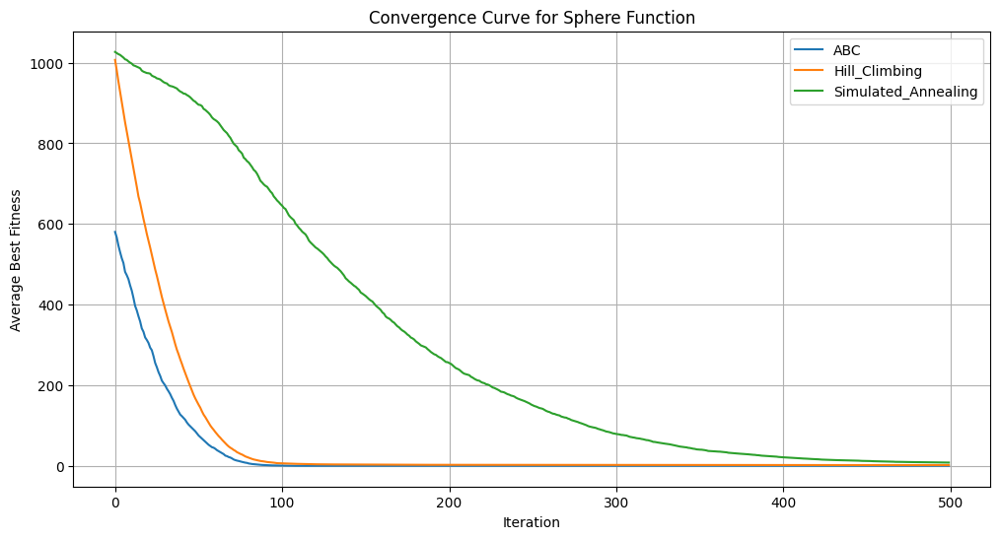

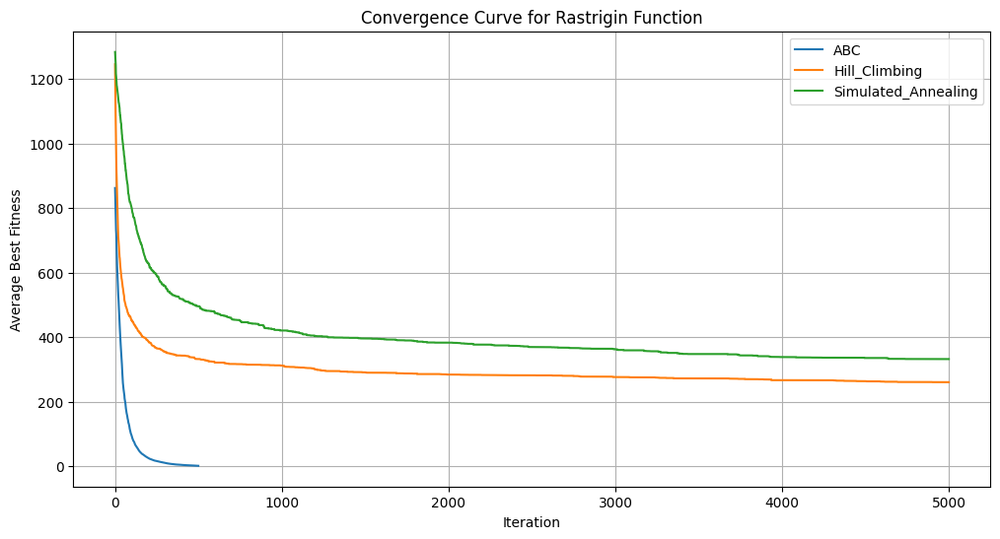

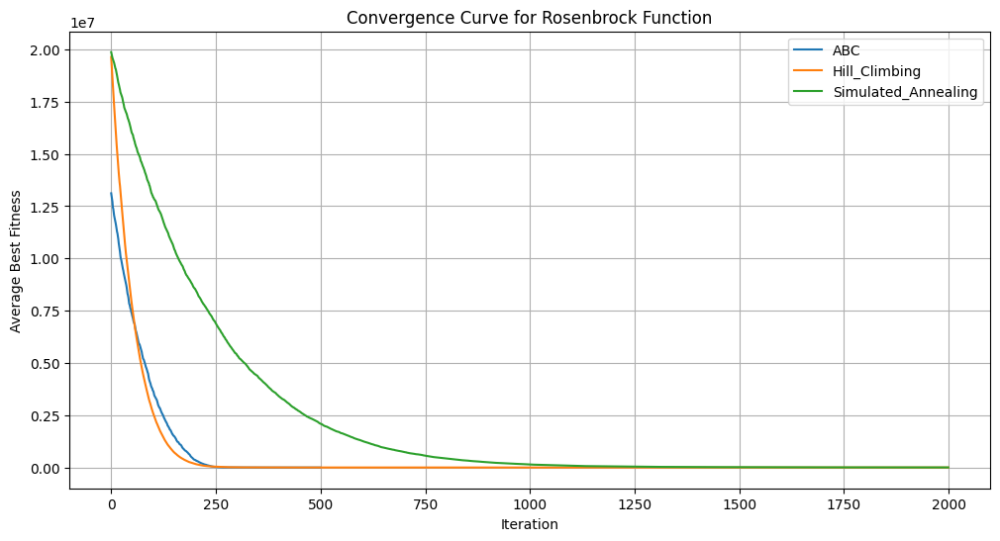


Generated convergence plots for all objective functions.


In [ ]:
print("\n" + "=" * 60)
print("Visualizing Convergence Curves")
print("=" * 60)

for func_name, algo_histories in avg_history.items():
    plt.figure(figsize=(12, 6))
    for algo_name, history in algo_histories.items():
        iterations = range(len(history))
        plt.plot(iterations, history, label=algo_name)

    plt.xlabel("Iteration")
    plt.ylabel("Average Best Fitness")
    plt.title(f"Convergence Curve for {func_name} Function")
    plt.legend()
    plt.grid(True)
    plt.show()

print("\nGenerated convergence plots for all objective functions.")

## Runtime comparison


In [ ]:
# Define different dimensions to test
dimensions_to_test = [2, 10, 30, 50]
num_runs = 30

# Update parameter dictionaries to handle varying dimensions
def create_params(dimensions, bounds_range, abc_base_params, hc_base_params, sa_base_params):
    params = {}
    for dim in dimensions:
        lower_bounds = [bounds_range[0]] * dim
        upper_bounds = [bounds_range[1]] * dim
        bounds = (lower_bounds, upper_bounds)

        params[dim] = {
            'ABC': {
                'dim': dim,
                'bounds': bounds,
                'colony_size': abc_base_params['colony_size'],
                'max_iter': abc_base_params['max_iter'],
                'limit': abc_base_params['limit']
            },
            'Hill_Climbing': {
                'bounds': bounds,
                'max_iterations': hc_base_params['max_iterations'],
                'step_size': hc_base_params['step_size'] * (dim/30) # Adjust step size based on dimension
            },
            'Simulated_Annealing': {
                'bounds': bounds,
                'max_iterations': sa_base_params['max_iterations'],
                'initial_temperature': sa_base_params['initial_temperature'],
                'cooling_rate': sa_base_params['cooling_rate'],
                'step_size': sa_base_params['step_size'] * (dim/30) # Adjust step size based on dimension
            }
        }

    return params

# Base parameters for each function and algorithm, independent of dimension (mostly)
sphere_base_abc_params = {'colony_size': 100, 'max_iter': 300, 'limit': 100}
sphere_base_hc_params = {'max_iterations': 100 * 20, 'step_size': 0.5}
sphere_base_sa_params = {'max_iterations': 100 * 20, 'initial_temperature': 100.0, 'cooling_rate': 0.95, 'step_size': 0.5}
sphere_params = create_params(dimensions_to_test, (-10, 10), sphere_base_abc_params, sphere_base_hc_params, sphere_base_sa_params)


rastrigin_base_abc_params = {'colony_size': 50, 'max_iter': 500, 'limit': 50}
rastrigin_base_hc_params = {'max_iterations': 100 * 20, 'step_size': 1.0}
rastrigin_base_sa_params = {'max_iterations': 100 * 20, 'initial_temperature': 200.0, 'cooling_rate': 0.95, 'step_size': 1.0}
rastrigin_params = create_params(dimensions_to_test, (-10, 10), rastrigin_base_abc_params, rastrigin_base_hc_params, rastrigin_base_sa_params)


rosenbrock_base_abc_params = {'colony_size': 40, 'max_iter': 500, 'limit': 40}
rosenbrock_base_hc_params = {'max_iterations': 100 * 20, 'step_size': 0.3}
rosenbrock_base_sa_params = {'max_iterations': 100 * 20, 'initial_temperature': 150.0, 'cooling_rate': 0.95, 'step_size': 0.3}
rosenbrock_params = create_params(dimensions_to_test, (-10, 10), rosenbrock_base_abc_params, rosenbrock_base_hc_params, rosenbrock_base_sa_params)


# Generate initial solutions for each function and dimension
initial_solutions = {}
np.random.seed(42) # for reproducibility

for dim in dimensions_to_test:
    sphere_bounds = ([-10] * dim, [10] * dim)
    rastrigin_bounds = ([-10] * dim, [10] * dim)
    rosenbrock_bounds = ([-10] * dim, [10] * dim)

    initial_solutions[dim] = {
        'Sphere': np.random.uniform(sphere_bounds[0], sphere_bounds[1], (num_runs, dim)),
        'Rastrigin': np.random.uniform(rastrigin_bounds[0], rastrigin_bounds[1], (num_runs, dim)),
        'Rosenbrock': np.random.uniform(rosenbrock_bounds[0], rosenbrock_bounds[1], (num_runs, dim))
    }


print(f"Number of runs set to: {num_runs}")
print(f"Dimensions to test: {dimensions_to_test}")
print("\nSphere function parameters defined for varying dimensions.")
print("Rastrigin function parameters defined for varying dimensions.")
print("Rosenbrock function parameters defined for varying dimensions.")
print(f"\nGenerated {num_runs} initial solutions for each function and dimension.")

Number of runs set to: 30
Dimensions to test: [2, 10, 30, 50]

Sphere function parameters defined for varying dimensions.
Rastrigin function parameters defined for varying dimensions.
Rosenbrock function parameters defined for varying dimensions.

Generated 30 initial solutions for each function and dimension.


In [ ]:
# Create a list of objective functions and their corresponding parameters and initial solutions
objective_functions = {
    'Sphere': sphere,
    'Rastrigin': rastrigin,
    'Rosenbrock': rosenbrock
}

params = {
    'Sphere': sphere_params,
    'Rastrigin': rastrigin_params,
    'Rosenbrock': rosenbrock_params
}

# Initialize a dictionary to store the results, structured by dimension
results = {}

print("=" * 60)
print("Running Optimization Experiments Across Dimensions")
print("=" * 60)

# Iterate through each dimension
for dim in dimensions_to_test:
    print(f"\n--- Running experiments for Dimension: {dim} ---")
    results[dim] = {}

    # Iterate through each objective function
    for func_name, obj_func in objective_functions.items():
        print(f"\n  Running experiments for: {func_name}")
        print("-" * 60)

        results[dim][func_name] = {}
        func_params = params[func_name][dim] # Get parameters for the current dimension
        # Initial solutions are generated in cell 2d834455, no need to get them here again

        # Iterate through each algorithm
        for algo_name in ['ABC', 'Hill_Climbing', 'Simulated_Annealing']:
            print(f"    Algorithm: {algo_name}")

            best_scores_list = []
            history_list = []
            runtimes_list = [] # List to store runtimes

            algo_params = func_params[algo_name]

            # Run multiple independent runs
            for run in range(num_runs):
                if run % 5 == 0: # Print progress every 5 runs
                     print(f"      Run {run+1}/{num_runs}...")

                # initial_sol = func_initial_solutions[run] # ABC does not take initial solution in optimize()

                # Instantiate and run the optimizer, measuring time
                start_time = time.time()
                if algo_name == 'ABC':
                    optimizer = ArtificialBeeColony(obj_function=obj_func, **algo_params)
                    best_pos, best_score = optimizer.optimize(verbose=False) # Set verbose to False
                    history = optimizer.convergence_curve
                elif algo_name == 'Hill_Climbing':
                    optimizer = HillClimbing(obj_func, **algo_params)
                    best_pos, best_score, history = optimizer.optimize(initial_solutions[dim][func_name][run], verbose=False) # Pass initial solution
                elif algo_name == 'Simulated_Annealing':
                    optimizer = SimulatedAnnealing(obj_func, **algo_params)
                    best_pos, best_score, history = optimizer.optimize(initial_solutions[dim][func_name][run], verbose=False) # Pass initial solution
                end_time = time.time()

                # Store results for this run
                best_scores_list.append(best_score)
                history_list.append(history)
                runtimes_list.append(end_time - start_time) # Store the runtime

            # Store results for this algorithm, objective function, and dimension
            results[dim][func_name][algo_name] = {
                'best_scores': best_scores_list,
                'history': history_list,
                'runtimes': runtimes_list # Store runtimes
            }
            print(f"    Finished {num_runs} runs for {algo_name} on {func_name} (Dim {dim}).")

print("\n" + "=" * 60)
print("Optimization experiments across dimensions completed.")
print("=" * 60)

# The 'results' dictionary now contains the data needed for analysis, including runtimes.

Running Optimization Experiments Across Dimensions

--- Running experiments for Dimension: 2 ---

  Running experiments for: Sphere
------------------------------------------------------------
    Algorithm: ABC
      Run 1/30...
      Run 6/30...
      Run 11/30...
      Run 16/30...
      Run 21/30...
      Run 26/30...
    Finished 30 runs for ABC on Sphere (Dim 2).
    Algorithm: Hill_Climbing
      Run 1/30...
      Run 6/30...
      Run 11/30...
      Run 16/30...
      Run 21/30...
      Run 26/30...
    Finished 30 runs for Hill_Climbing on Sphere (Dim 2).
    Algorithm: Simulated_Annealing
      Run 1/30...
      Run 6/30...
      Run 11/30...
      Run 16/30...
      Run 21/30...
      Run 26/30...
    Finished 30 runs for Simulated_Annealing on Sphere (Dim 2).

  Running experiments for: Rastrigin
------------------------------------------------------------
    Algorithm: ABC
      Run 1/30...
      Run 6/30...
      Run 11/30...
      Run 16/30...
      Run 21/30...
      R

In [ ]:
runtime_analysis_results = {}

print("\n" + "=" * 60)
print("Runtime Analysis")
print("=" * 60)

for dim, func_results in results.items():
    print(f"\n--- Analyzing Runtimes for Dimension: {dim} ---")
    runtime_analysis_results[dim] = {}

    for func_name, algo_results in func_results.items():
        print(f"  Analyzing runtimes for: {func_name}")
        runtime_analysis_results[dim][func_name] = {}

        for algo_name, data in algo_results.items():
            runtimes = np.array(data['runtimes'])
            avg_runtime = np.mean(runtimes)
            std_runtime = np.std(runtimes)

            runtime_analysis_results[dim][func_name][algo_name] = {
                'avg_runtime': avg_runtime,
                'std_runtime': std_runtime
            }
            print(f"    {algo_name}: Avg Runtime = {avg_runtime:.6f} seconds, Std Dev Runtime = {std_runtime:.6f} seconds")

print("\n" + "=" * 60)
print("Runtime Analysis Complete.")
print("=" * 60)


Runtime Analysis

--- Analyzing Runtimes for Dimension: 2 ---
  Analyzing runtimes for: Sphere
    ABC: Avg Runtime = 2.811604 seconds, Std Dev Runtime = 0.305960 seconds
    Hill_Climbing: Avg Runtime = 0.293023 seconds, Std Dev Runtime = 0.075623 seconds
    Simulated_Annealing: Avg Runtime = 0.039857 seconds, Std Dev Runtime = 0.011588 seconds
  Analyzing runtimes for: Rastrigin
    ABC: Avg Runtime = 2.655460 seconds, Std Dev Runtime = 0.322321 seconds
    Hill_Climbing: Avg Runtime = 0.389043 seconds, Std Dev Runtime = 0.087711 seconds
    Simulated_Annealing: Avg Runtime = 0.047918 seconds, Std Dev Runtime = 0.012362 seconds
  Analyzing runtimes for: Rosenbrock
    ABC: Avg Runtime = 2.276506 seconds, Std Dev Runtime = 0.273469 seconds
    Hill_Climbing: Avg Runtime = 0.445143 seconds, Std Dev Runtime = 0.111079 seconds
    Simulated_Annealing: Avg Runtime = 0.055250 seconds, Std Dev Runtime = 0.015427 seconds

--- Analyzing Runtimes for Dimension: 10 ---
  Analyzing runtimes fo


Visualizing Runtime vs. Dimension


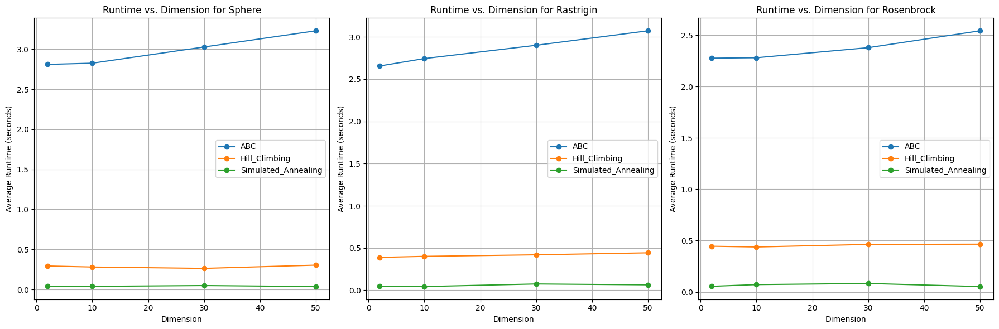


Generated runtime vs. dimension plots for all objective functions.


In [ ]:
# 3. Create plots for runtime analysis
print("\n" + "=" * 60)
print("Visualizing Runtime vs. Dimension")
print("=" * 60)

# Create a figure with subplots for each objective function
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.flatten() # Flatten in case of multiple rows/columns

objective_function_names = list(runtime_analysis_results[list(runtime_analysis_results.keys())[0]].keys())

for i, func_name in enumerate(objective_function_names):
    ax = axes[i]
    ax.set_title(f"Runtime vs. Dimension for {func_name}")
    ax.set_xlabel("Dimension")
    ax.set_ylabel("Average Runtime (seconds)")
    ax.grid(True)

    # Extract dimensions and runtimes for plotting
    dimensions = sorted(runtime_analysis_results.keys()) # Ensure dimensions are in order

    for algo_name in ['ABC', 'Hill_Climbing', 'Simulated_Annealing']:
        if algo_name in runtime_analysis_results[dimensions[0]][func_name]: # Check if algorithm data exists
            avg_runtimes = [runtime_analysis_results[dim][func_name][algo_name]['avg_runtime'] for dim in dimensions]
            ax.plot(dimensions, avg_runtimes, marker='o', label=algo_name)
        else:
            print(f"No runtime data to plot for {algo_name} on {func_name}.")


    ax.legend()

plt.tight_layout() # Adjust layout to prevent overlap
plt.show()

print("\nGenerated runtime vs. dimension plots for all objective functions.")

## Implement BFS, DFS and A* for TSP

In [ ]:
def astar_tsp(distances):
    """
    Solve TSP using A* search with optimal state representation.

    Time: O(n! * n) worst case, but pruned by heuristic
    Space: O(n! * n) for visited states
    """
    n = len(distances)
    best_distance = float('inf')
    best_path = None

    # Priority queue: (f_cost, path_as_tuple, current_dist)
    pq = [(0, (start,), 0) for start in range(n)]

    # Track best cost to reach each (visited_set, current_city) state
    visited = {}

    def heuristic(curr, visited_set_frozenset):
        """MST-based heuristic for remaining cities."""
        # Convert frozenset back to a mutable set for easier manipulation
        visited_set = set(visited_set_frozenset)
        unvisited = [i for i in range(n) if i not in visited_set]

        # Handle the case where there are no unvisited cities
        if not unvisited:
            # Return 0 if no unvisited cities left
            return 0.0

        # Min edge from current to unvisited
        # Ensure we don't access distances with invalid indices
        min_edge_curr_unvisited = float('inf')
        for city in unvisited:
            if curr < len(distances) and city < len(distances[curr]):
                 min_edge_curr_unvisited = min(min_edge_curr_unvisited, distances[curr][city])

        h = min_edge_curr_unvisited if min_edge_curr_unvisited != float('inf') else 0.0


        # MST approximation: sum of two smallest edges for each unvisited city
        if len(unvisited) > 1:
            edges = []
            for city in unvisited:
                city_edges = [distances[city][other] for other in range(n)
                             if other != city and other not in visited_set]
                # Add edges to other unvisited cities
                city_edges.extend([distances[city][other] for other in unvisited
                                  if other != city])
                # Only consider if city_edges is not empty to avoid errors with sorted
                if city_edges:
                  edges.extend(sorted(city_edges)[:2])

            # Ensure edges is not empty before summing
            if edges:
              h += sum(sorted(edges)[:len(unvisited)]) / 2

        return h

    while pq:
        f_cost, path, curr_dist = heapq.heappop(pq)
        curr = path[-1]

        # Complete tour found
        if len(path) == n:
            # Ensure the edge back to the start city exists
            if curr < len(distances) and path[0] < len(distances[curr]):
                total = curr_dist + distances[curr][path[0]]
                if total < best_distance:
                    best_distance = total
                    best_path = list(path)
            continue

        # State pruning: skip if we've seen this state with better cost
        visited_set_frozenset = frozenset(path)
        state = (visited_set_frozenset, curr)
        if state in visited and visited[state] <= curr_dist:
            continue
        visited[state] = curr_dist

        # Pruning: skip if current distance already exceeds best
        # Add a small tolerance for floating point comparisons
        if curr_dist >= best_distance - 1e-9: # Use tolerance for comparison
            continue

        # Explore neighbors
        for next_city in range(n):
            if next_city not in visited_set_frozenset:
                # Ensure the edge exists before adding to distance
                if curr < len(distances) and next_city < len(distances[curr]):
                    new_dist = curr_dist + distances[curr][next_city]
                    new_path = path + (next_city,)
                    # Pass the frozenset to the heuristic
                    h = heuristic(next_city, visited_set_frozenset | {next_city})
                    # Check if heuristic is a valid number before pushing to pq
                    if not np.isnan(h) and not np.isinf(h):
                        heapq.heappush(pq, (new_dist + h, new_path, new_dist))


    return best_path, best_distance


def bfs_tsp(distances):
    """
    Solve TSP using BFS with branch-and-bound pruning.

    Time: O(n! * n) worst case
    Space: O(n! * n) for queue
    """
    n = len(distances)
    queue = collections.deque([(tuple([start]), 0) for start in range(n)])

    best_distance = float('inf')
    best_path = None
    convergence = []

    while queue:
        path, curr_dist = queue.popleft()
        curr = path[-1]

        if len(path) == n:
            # Ensure the edge back to the start city exists
            if curr < len(distances) and path[0] < len(distances[curr]):
                total = curr_dist + distances[curr][path[0]]
                if total < best_distance:
                    best_distance = total
                    best_path = list(path)
                    convergence.append(best_distance) # Append when a new best is found
        else:
            visited_set = set(path)
            for next_city in range(n):
                if next_city not in visited_set:
                    # Ensure the edge exists before adding to distance
                    if curr < len(distances) and next_city < len(distances[curr]):
                        new_dist = curr_dist + distances[curr][next_city]
                        # Add a small tolerance for floating point comparisons
                        if new_dist < best_distance - 1e-9:  # Branch-and-bound pruning
                            queue.append((path + (next_city,), new_dist))

    return best_path, best_distance, convergence


def dfs_tsp(distances):
    """
    Solve TSP using DFS with branch-and-bound pruning.

    Time: O(n! * n) worst case
    Space: O(n) recursion depth
    """
    n = len(distances)
    best = {'distance': float('inf'), 'path': None, 'history': []}

    def solve(path, curr_dist, visited_set):
        curr = path[-1]

        if len(path) == n:
            # Ensure the edge back to the start city exists
            if curr < len(distances) and path[0] < len(distances[curr]):
                total = curr_dist + distances[curr][path[0]]
                if total < best['distance']:
                    best['distance'] = total
                    best['path'] = path[:]
                    best['history'].append(best['distance']) # Append when a new best is found
            return

        for next_city in range(n):
            if next_city not in visited_set:
                # Ensure the edge exists before adding to distance
                if curr < len(distances) and next_city < len(distances[curr]):
                    new_dist = curr_dist + distances[curr][next_city]
                    # Add a small tolerance for floating point comparisons
                    if new_dist < best['distance'] - 1e-9:  # Branch-and-bound pruning
                        path.append(next_city)
                        visited_set.add(next_city)
                        solve(path, new_dist, visited_set)
                        path.pop()
                        visited_set.remove(next_city)

    for start in range(n):
        solve([start], 0, {start})

    return best['path'], best['distance'], best['history']

## Run ACO multiple times and visualize the convergence speed


In [ ]:
# Number of independent runs
num_runs = 10

# Fixed ABC-TSP parameters for this comparison
fixed_abc_tsp_params = {
    'colony_size': 30,  # Number of food sources (employed bees)
    'n_iterations': 200, # Maximum number of iterations
    'limit': 50,        # Abandonment limit for scout bees
}


# Number of cities for the TSP instance
n_cities_experiment = 100

print(f"Robustness experiment parameters:")
print(f"  Number of runs: {num_runs}")
print(f"  Number of cities per instance: {n_cities_experiment}")
print(f"  TSP Instance Variation: Different random seeds for city generation per run.")
print(f"  ABC-TSP Parameter Variation: Fixed parameters for all runs:")
for param, value in fixed_abc_tsp_params.items():
    print(f"    {param}: {value}")

Robustness experiment parameters:
  Number of runs: 10
  Number of cities per instance: 100
  TSP Instance Variation: Different random seeds for city generation per run.
  ABC-TSP Parameter Variation: Fixed parameters for all runs:
    colony_size: 30
    n_iterations: 200
    limit: 50


In [ ]:
experiment_results = []

print(f"\nRunning robustness experiment ({num_runs} runs, {n_cities_experiment} cities)...")
print("-" * 60)

# Initialize RANDOM_SEED
RANDOM_SEED = 42

for run in range(num_runs):
    print(f"Starting run {run + 1}/{num_runs}...")

    # Generate a new random seed for each run to create a different TSP instance
    run_seed = RANDOM_SEED + run if RANDOM_SEED is not None else int(time.time()) + run
    np.random.seed(run_seed)

    # Generate random city coordinates for the current run
    coords = np.random.rand(n_cities_experiment, 2) * 100

    # Calculate Euclidean distance matrix
    distances = np.zeros((n_cities_experiment, n_cities_experiment))
    for i in range(n_cities_experiment):
        for j in range(n_cities_experiment):
            distances[i, j] = np.linalg.norm(coords[i] - coords[j])

    # Initialize and run ABC-TSP with fixed parameters
    abc_tsp = ArtificialBeeColonyTSP(
        distance_matrix=distances,
        **fixed_abc_tsp_params # Use the fixed parameters defined earlier
    )

    start_time = time.time()
    best_path, best_distance = abc_tsp.optimize(verbose=False) # Run ABC without verbose output
    run_time = time.time() - start_time
    convergence_history = [-d for d in abc_tsp.convergence_curve] # Store negative distance for consistency with previous plot

    # Store the results for this run
    experiment_results.append({
        'run': run + 1,
        'seed': run_seed,
        'n_cities': n_cities_experiment,
        'abc_tsp_params': fixed_abc_tsp_params,
        'best_distance': best_distance,
        'best_path': best_path.tolist(), # Convert numpy array to list for easier storage/analysis
        'convergence_history': convergence_history,
        'time': run_time,
    })

    print(f"  Run {run + 1} completed in {run_time:.4f}s. Best Distance: {best_distance:.2f}")

print("-" * 60)
print("Experiment finished.")


Running robustness experiment (10 runs, 100 cities)...
------------------------------------------------------------
Starting run 1/10...
  Run 1 completed in 1.2712s. Best Distance: 2689.71
Starting run 2/10...
  Run 2 completed in 1.3029s. Best Distance: 2727.24
Starting run 3/10...
  Run 3 completed in 1.2519s. Best Distance: 2626.51
Starting run 4/10...
  Run 4 completed in 1.8286s. Best Distance: 2513.23
Starting run 5/10...
  Run 5 completed in 1.7755s. Best Distance: 2582.69
Starting run 6/10...
  Run 6 completed in 1.2602s. Best Distance: 2459.35
Starting run 7/10...
  Run 7 completed in 1.2857s. Best Distance: 2548.16
Starting run 8/10...
  Run 8 completed in 1.2369s. Best Distance: 2534.82
Starting run 9/10...
  Run 9 completed in 1.3007s. Best Distance: 2450.48
Starting run 10/10...
  Run 10 completed in 1.2757s. Best Distance: 2468.48
------------------------------------------------------------
Experiment finished.



EXPERIMENT ANALYSIS

Summary Statistics for 10 Runs (N=100 cities):
--------------------------------------------------
Best Distance:
  Mean: 2560.07
  Std Dev: 91.21
  Min: 2450.48
  Max: 2727.24

Execution Time (seconds):
  Mean: 1.3789
  Std Dev: 0.2128
  Min: 1.2369
  Max: 1.8286
--------------------------------------------------

Detailed Results per Run:
Run   | Seed     | Best Distance   | Time (s)  
--------------------------------------------------
1     | 42       | 2689.71         | 1.2712    
2     | 43       | 2727.24         | 1.3029    
3     | 44       | 2626.51         | 1.2519    
4     | 45       | 2513.23         | 1.8286    
5     | 46       | 2582.69         | 1.7755    
6     | 47       | 2459.35         | 1.2602    
7     | 48       | 2548.16         | 1.2857    
8     | 49       | 2534.82         | 1.2369    
9     | 50       | 2450.48         | 1.3007    
10    | 51       | 2468.48         | 1.2757    
--------------------------------------------------


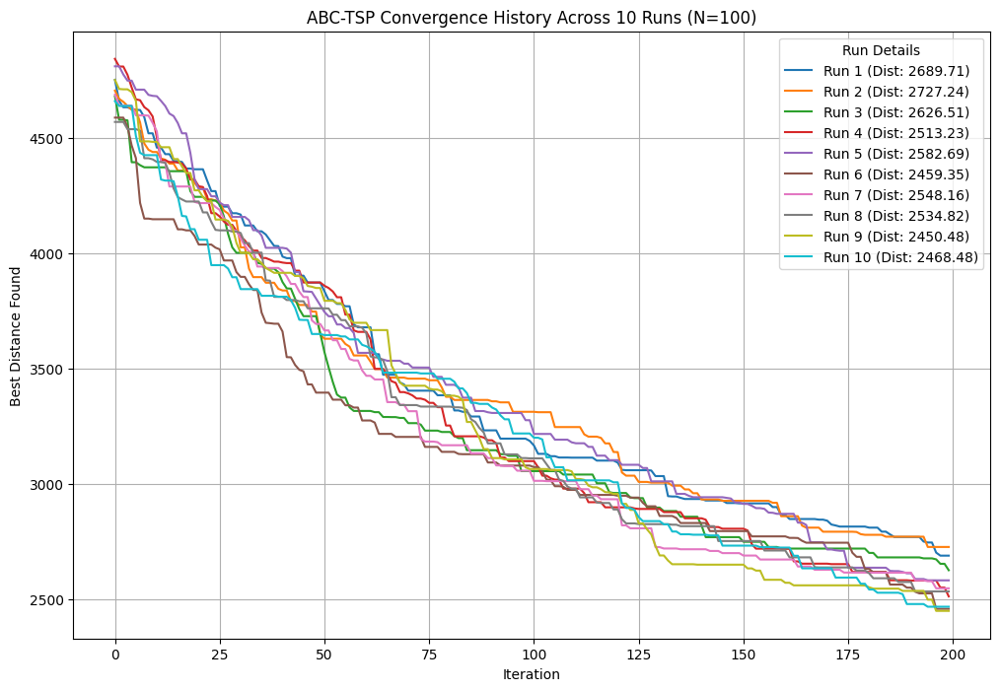


Analysis complete.


In [ ]:
# Analyze and summarize the experiment results

print("\n" + "="*60)
print("EXPERIMENT ANALYSIS")
print("="*60 + "\n")

# Extract best distances and times
best_distances = [result['best_distance'] for result in experiment_results]
execution_times = [result['time'] for result in experiment_results]

# Calculate summary statistics for best distances
mean_distance = np.mean(best_distances)
std_distance = np.std(best_distances)
min_distance = np.min(best_distances)
max_distance = np.max(best_distances)

# Calculate summary statistics for execution times
mean_time = np.mean(execution_times)
std_time = np.std(execution_times)
min_time = np.min(execution_times)
max_time = np.max(execution_times)

print(f"Summary Statistics for {num_runs} Runs (N={n_cities_experiment} cities):")
print("-" * 50)
print(f"Best Distance:")
print(f"  Mean: {mean_distance:.2f}")
print(f"  Std Dev: {std_distance:.2f}")
print(f"  Min: {min_distance:.2f}")
print(f"  Max: {max_distance:.2f}")
print(f"\nExecution Time (seconds):")
print(f"  Mean: {mean_time:.4f}")
print(f"  Std Dev: {std_time:.4f}")
print(f"  Min: {min_time:.4f}")
print(f"  Max: {max_time:.4f}")
print("-" * 50)

# Optional: Print results for each run
print("\nDetailed Results per Run:")
print(f"{'Run':<5} | {'Seed':<8} | {'Best Distance':<15} | {'Time (s)':<10}")
print("-" * 50)
for result in experiment_results:
    print(f"{result['run']:<5} | {result['seed']:<8} | {result['best_distance']:<15.2f} | {result['time']:<10.4f}")
print("-" * 50)

# Optional: Plot convergence histories
plt.figure(figsize=(12, 8))
for i, result in enumerate(experiment_results):
    plt.plot(result['convergence_history'], label=f"Run {result['run']} (Dist: {result['best_distance']:.2f})")

plt.title(f"ABC-TSP Convergence History Across {num_runs} Runs (N={n_cities_experiment})")
plt.xlabel("Iteration")
plt.ylabel("Best Distance Found")
plt.legend(title="Run Details")
plt.grid(True)
plt.show()

print("\nAnalysis complete.")
print("="*60)

## Compare runtime between algorithms


In [ ]:
num_comparison_runs = 3

# Different numbers of cities (N) to test
n_values_to_compare = [7, 10, 20, 50]

# Fixed ABC parameters for this comparison (Changed from ACO)
comparison_abc_params = { # Changed from comparison_aco_params
    'colony_size': 30,  # Number of food sources (employed bees)
    'n_iterations': 200, # Maximum number of iterations (Changed from n_iterations)
    'limit': 50,        # Abandonment limit for scout bees (Changed from limit)
}

print(f"Comparison experiment parameters:")
print(f"  Number of runs per N: {num_comparison_runs}")
print(f"  N values to compare: {n_values_to_compare}")
print(f"  Fixed ABC parameters for comparison:") # Changed from ACO
for param, value in comparison_abc_params.items(): # Changed from comparison_aco_params
    print(f"    {param}: {value}")

Comparison experiment parameters:
  Number of runs per N: 3
  N values to compare: [7, 10, 20, 50]
  Fixed ABC parameters for comparison:
    colony_size: 30
    n_iterations: 200
    limit: 50



Starting Comparison Experiment (3 runs per N, N values: [7, 10, 20, 50])...

Testing N = 7 cities...
----------------------------------------
  Run 1/3 for N = 7...
    Running BFS...
      ✓ Completed in 0.0198s - Distance: 287.88
    Running DFS...
      ✓ Completed in 0.0045s - Distance: 287.88
    Running A*...
      ✓ Completed in 0.0126s - Distance: 287.88
    Running ABC...
      ✓ Completed in 0.6245s - Distance: 287.88
  Run 2/3 for N = 7...
    Running BFS...
      ✓ Completed in 0.0115s - Distance: 248.78
    Running DFS...
      ✓ Completed in 0.0045s - Distance: 248.78
    Running A*...
      ✓ Completed in 0.0125s - Distance: 248.78
    Running ABC...
      ✓ Completed in 0.6612s - Distance: 248.78
  Run 3/3 for N = 7...
    Running BFS...
      ✓ Completed in 0.0111s - Distance: 278.38
    Running DFS...
      ✓ Completed in 0.0062s - Distance: 278.38
    Running A*...
      ✓ Completed in 0.0142s - Distance: 278.38
    Running ABC...
      ✓ Completed in 0.6098s - Dist

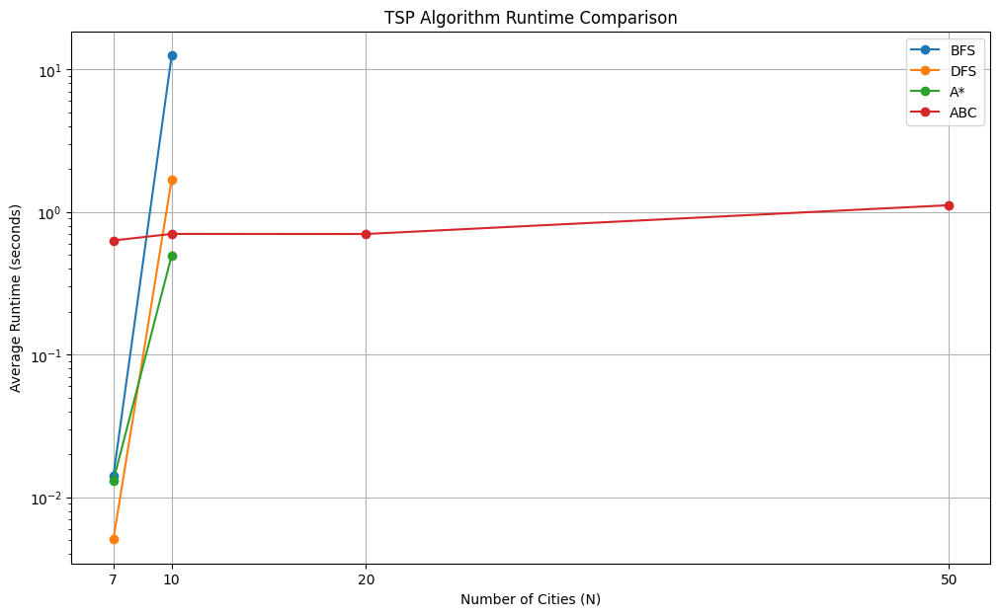


Runtime comparison plot generated.


In [ ]:
comparison_results = {} # Dictionary to store results, keyed by N and then algorithm

print(f"\nStarting Comparison Experiment ({num_comparison_runs} runs per N, N values: {n_values_to_compare})...")
print("=" * 80)

for n in n_values_to_compare:
    print(f"\nTesting N = {n} cities...")
    print("-" * 40)

    # Determine which algorithms are feasible for this N
    runnable_algorithms = {
        'BFS': n <= 10, # BFS becomes very slow quickly
        'DFS': n <= 15, # DFS is generally more memory efficient but still exponential time
        'A*': n <= 15,  # A* is better than brute force but still exponential
        'ABC': True     # ABC is heuristic, generally scales better
    }

    comparison_results[n] = {} # Initialize results dictionary for this N

    for run in range(1, num_comparison_runs + 1):
        print(f"  Run {run}/{num_comparison_runs} for N = {n}...")

        # Generate a new random seed for each run/N combination
        run_seed = int(time.time()) + n * 1000 + run # Using time and n for variability
        np.random.seed(run_seed)

        # Generate random city coordinates
        coords = np.random.rand(n, 2) * 100

        # Calculate Euclidean distance matrix
        distances_np = np.zeros((n, n))
        for i in range(n):
            for j in range(n):
                distances_np[i, j] = np.linalg.norm(coords[i] - coords[j])

        distances_list = distances_np.tolist() # Convert for list-based algorithms (BFS, DFS, A*)

        # Run the selected algorithms if feasible
        for algo_name, is_runnable in runnable_algorithms.items():
            if is_runnable:
                print(f"    Running {algo_name}...")
                try:
                    start_time = time.time()
                    best_path = None
                    best_distance = float('inf')
                    convergence = []

                    if algo_name == 'BFS':
                        best_path, best_distance, convergence = bfs_tsp(distances_list)
                    elif algo_name == 'DFS':
                        best_path, best_distance, convergence = dfs_tsp(distances_list)
                    elif algo_name == 'A*':
                        best_path, best_distance = astar_tsp(distances_list)
                        # A* typically returns the optimal path and distance directly,
                        # so convergence history is not tracked in the same way.
                        # We can just record the final best distance.
                        convergence = [best_distance]
                    elif algo_name == 'ABC':
                        # ABC uses the numpy distance matrix
                        abc = ArtificialBeeColonyTSP(
                            distance_matrix=distances_np,
                            **comparison_abc_params # Use fixed ABC params
                        )
                        best_path, best_distance = abc.optimize(verbose=False)
                        # Store negative distance for consistency with previous plot if needed,
                        # but for runtime comparison, the distance value itself isn't as critical.
                        # We can just store the best distance found.
                        convergence = [-d for d in abc.convergence_curve]


                    run_time = time.time() - start_time

                    # Store results for this specific run and algorithm
                    if algo_name not in comparison_results[n]:
                        comparison_results[n][algo_name] = []

                    comparison_results[n][algo_name].append({
                        'run': run,
                        'seed': run_seed,
                        'n_cities': n,
                        'best_distance': float(best_distance), # Ensure float
                        'best_path': best_path.tolist() if isinstance(best_path, np.ndarray) else best_path,
                        'convergence_history': [float(d) for d in convergence], # Ensure floats
                        'time': run_time,
                        'status': 'Success'
                    })
                    print(f"      ✓ Completed in {run_time:.4f}s - Distance: {best_distance:.2f}")

                except Exception as e:
                    print(f"      ✗ Failed: {str(e)}")
                    if algo_name not in comparison_results[n]:
                        comparison_results[n][algo_name] = []
                    comparison_results[n][algo_name].append({'status': 'Failed', 'error': str(e), 'run': run, 'seed': run_seed, 'n_cities': n})

            else:
                print(f"    Skipping {algo_name} (N={n} too large)")

    # Calculate and print average runtimes for this N
    print(f"\n  Average Runtimes for N = {n}:")
    for algo_name in runnable_algorithms.keys():
        if algo_name in comparison_results[n] and comparison_results[n][algo_name]:
            successful_runs = [r for r in comparison_results[n][algo_name] if r['status'] == 'Success']
            if successful_runs:
                avg_time = np.mean([r['time'] for r in successful_runs])
                print(f"    {algo_name}: {avg_time:.4f}s (based on {len(successful_runs)} successful runs)")
            elif algo_name in runnable_algorithms and runnable_algorithms[algo_name]:
                 print(f"    {algo_name}: No successful runs")
        elif algo_name in runnable_algorithms and runnable_algorithms[algo_name]:
             print(f"    {algo_name}: Skipped or no runs recorded")


    print("-" * 40)


print("=" * 80)
print("Comparison Experiment finished.")

# --- Plotting the results ---

print("\n" + "=" * 80)
print("Plotting Runtime Comparison")
print("=" * 80)

plt.figure(figsize=(12, 7))

# Prepare data for plotting
algo_runtimes = {algo: [] for algo in ['BFS', 'DFS', 'A*', 'ABC']} # Initialize lists for each algorithm
algo_n_values = {algo: [] for algo in ['BFS', 'DFS', 'A*', 'ABC']} # Initialize lists for corresponding N values

for n in sorted(comparison_results.keys()): # Sort N values for plotting
    for algo_name, results_list in comparison_results[n].items():
        successful_runs = [r for r in results_list if r['status'] == 'Success']
        if successful_runs:
            avg_time = np.mean([r['time'] for r in successful_runs])
            algo_runtimes[algo_name].append(avg_time)
            algo_n_values[algo_name].append(n)

# Plot each algorithm's runtime vs N
for algo_name in ['BFS', 'DFS', 'A*', 'ABC']:
    if algo_runtimes[algo_name]: # Only plot if there's data
        plt.plot(algo_n_values[algo_name], algo_runtimes[algo_name], marker='o', linestyle='-', label=algo_name)

plt.xlabel("Number of Cities (N)")
plt.ylabel("Average Runtime (seconds)")
plt.title("TSP Algorithm Runtime Comparison")
plt.xticks(n_values_to_compare) # Set x-ticks to the tested N values
plt.yscale('log') # Use log scale for y-axis due to exponential nature of some algos
plt.legend()
plt.grid(True)
plt.show()

print("\nRuntime comparison plot generated.")

# **Visualization**

In [ ]:
# Designed to run on GG Colab only.
class ABCVisualizer:
    """
    Visualizer for Artificial Bee Colony Algorithm
    Shows the three phases: Employed Bees, Onlooker Bees, and Scout Bees
    """

    def __init__(self, obj_function, bounds, colony_size=20, max_iter=50,
                 limit=10, seed=None, resolution=100):
        """
        Initialize the ABC visualizer.

        Parameters:
        -----------
        obj_function : callable
            2D objective function to minimize (must accept x, y)
        bounds : tuple
            (lower_bound, upper_bound) for both dimensions
        colony_size : int
            Number of food sources
        max_iter : int
            Maximum number of iterations
        limit : int
            Abandonment limit for scout bees
        seed : int, optional
            Random seed for reproducibility
        resolution : int
            Resolution for contour plot
        """
        self.obj_function = obj_function
        self.lb, self.ub = bounds
        self.colony_size = colony_size
        self.max_iter = max_iter
        self.limit = limit
        self.resolution = resolution

        if seed is not None:
            np.random.seed(seed)

        # Initialize population
        self.population = np.random.uniform(
            self.lb, self.ub, (self.colony_size, 2)
        )
        self.fitness = np.array([self.obj_function(ind[0], ind[1])
                                 for ind in self.population])
        self.trial_counter = np.zeros(self.colony_size)

        # Track best solution
        best_idx = np.argmin(self.fitness)
        self.best_solution = self.population[best_idx].copy()
        self.best_fitness = self.fitness[best_idx]
        self.convergence_curve = [self.best_fitness]

        # Visualization setup
        self.images = []
        self.img_index = 0
        self.filename = "ABC_Animation"
        self.fig = None
        self.ax_main = None
        self.ax_convergence = None

        # Create contour plot data
        self._create_contour_data()

    def _create_contour_data(self):
        """Pre-compute contour plot data"""
        x = np.linspace(self.lb, self.ub, self.resolution)
        y = np.linspace(self.lb, self.ub, self.resolution)
        self.X, self.Y = np.meshgrid(x, y)
        self.Z = np.zeros_like(self.X)

        for i in range(self.resolution):
            for j in range(self.resolution):
                self.Z[i, j] = self.obj_function(self.X[i, j], self.Y[i, j])

    def _capture(self, nframes=1):
        """Capture current frame"""
        output_dir = '/content/outputs'
        os.makedirs(output_dir, exist_ok=True)

        for i in range(nframes):
            image_path = os.path.join(output_dir, f"{self.filename}_{self.img_index:04d}.png")
            self.img_index += 1
            self.fig.savefig(image_path, dpi=100, bbox_inches='tight')
            self.images.append(image_path)

    def _plot_contour(self, ax, title=""):
        """Plot contour background"""
        ax.clear()
        ax.contour(self.X, self.Y, self.Z, levels=20, alpha=0.3, colors='gray')
        ax.contourf(self.X, self.Y, self.Z, levels=20, alpha=0.2, cmap='viridis')
        ax.set_xlim(self.lb, self.ub)
        ax.set_ylim(self.lb, self.ub)
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.axis('off')

    def _plot_population(self, ax, highlight_indices=None, highlight_color='red',
                        new_positions=None, show_trials=False):
        """Plot the current population"""
        # Plot all food sources
        for i in range(self.colony_size):
            alpha = 0.3 if highlight_indices is not None and i not in highlight_indices else 0.6
            size = 100 if highlight_indices is None or i not in highlight_indices else 150

            ax.scatter(self.population[i, 0], self.population[i, 1],
                      c='blue', s=size, alpha=alpha, edgecolors='black', linewidths=1, zorder=3)

            # Show trial counter if requested
            if show_trials:
                ax.text(self.population[i, 0], self.population[i, 1],
                       f'{int(self.trial_counter[i])}',
                       fontsize=8, ha='center', va='center', color='white',
                       fontweight='bold', zorder=4)

        # Highlight specific bees
        if highlight_indices is not None:
            for idx in highlight_indices:
                ax.scatter(self.population[idx, 0], self.population[idx, 1],
                          c=highlight_color, s=200, alpha=0.8, edgecolors='black',
                          linewidths=2, zorder=4, marker='*')

        # Show new positions if provided
        if new_positions is not None:
            for pos in new_positions:
                ax.scatter(pos[0], pos[1], c='green', s=150, alpha=0.7,
                          edgecolors='black', linewidths=2, zorder=4, marker='D')

        # Always show best solution
        ax.scatter(self.best_solution[0], self.best_solution[1],
                  c='gold', s=300, alpha=0.9, edgecolors='black',
                  linewidths=2, zorder=5, marker='*', label='Best')

    def _update_convergence_plot(self):
        """Update convergence curve"""
        self.ax_convergence.clear()
        self.ax_convergence.plot(self.convergence_curve, 'b-', linewidth=2)
        self.ax_convergence.scatter(len(self.convergence_curve)-1,
                                   self.convergence_curve[-1],
                                   c='red', s=100, zorder=5)
        self.ax_convergence.set_xlabel('Iteration', fontsize=10)
        self.ax_convergence.set_ylabel('Best Fitness', fontsize=10)
        self.ax_convergence.set_title('Convergence Curve', fontsize=12, fontweight='bold')
        self.ax_convergence.grid(True, alpha=0.3)
        self.ax_convergence.set_xlim(0, max(10, len(self.convergence_curve)))

    def calculate_probabilities(self):
        """Calculate selection probabilities"""
        fitness_values = self.fitness.copy()
        if np.min(fitness_values) < 0:
            fitness_values = fitness_values + np.abs(np.min(fitness_values))
        fitness_values = 1.0 / (1.0 + fitness_values)
        probabilities = fitness_values / np.sum(fitness_values)
        return probabilities

    def employed_bee_phase_visual(self, iteration):
        """Employed bee phase with visualization"""
        improved = []
        new_positions = []

        for i in range(self.colony_size):
            # Show current bee being explored
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Employed Bee {i+1}/{self.colony_size}")
            self._plot_population(self.ax_main, highlight_indices=[i],
                                highlight_color='orange')
            self._update_convergence_plot()
            self._capture(1)

            # Generate new solution
            j = np.random.randint(0, 2)
            k = i
            while k == i:
                k = np.random.randint(0, self.colony_size)

            phi = np.random.uniform(-1, 1)
            new_solution = self.population[i].copy()
            new_solution[j] = self.population[i, j] + phi * (
                self.population[i, j] - self.population[k, j]
            )
            new_solution = np.clip(new_solution, self.lb, self.ub)
            new_fitness = self.obj_function(new_solution[0], new_solution[1])

            # Show new position
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Employed Bee {i+1} - Testing")
            self._plot_population(self.ax_main, highlight_indices=[i],
                                highlight_color='orange', new_positions=[new_solution])

            # Draw arrow from old to new position
            self.ax_main.arrow(self.population[i, 0], self.population[i, 1],
                             new_solution[0] - self.population[i, 0],
                             new_solution[1] - self.population[i, 1],
                             head_width=0.1, head_length=0.1, fc='orange',
                             ec='orange', alpha=0.6, linewidth=2, zorder=3)
            self._update_convergence_plot()
            self._capture(1)

            # Greedy selection
            if new_fitness < self.fitness[i]:
                self.population[i] = new_solution
                self.fitness[i] = new_fitness
                self.trial_counter[i] = 0
                improved.append(i)

                if new_fitness < self.best_fitness:
                    self.best_solution = new_solution.copy()
                    self.best_fitness = new_fitness
            else:
                self.trial_counter[i] += 1

        return improved

    def onlooker_bee_phase_visual(self, iteration):
        """Onlooker bee phase with visualization"""
        probabilities = self.calculate_probabilities()
        improved = []

        # Show probability distribution
        self._plot_contour(self.ax_main,
                         f"Iteration {iteration+1} - Onlooker Phase (Probabilities)")

        # Plot with sizes based on probability
        for i in range(self.colony_size):
            size = 100 + probabilities[i] * 500
            self.ax_main.scatter(self.population[i, 0], self.population[i, 1],
                               c='purple', s=size, alpha=0.5, edgecolors='black',
                               linewidths=1, zorder=3)
        self._plot_population(self.ax_main)
        self._update_convergence_plot()
        self._capture(2)

        for bee_num in range(self.colony_size):
            # Roulette wheel selection
            i = np.random.choice(self.colony_size, p=probabilities)

            # Show selected food source
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Onlooker Bee {bee_num+1}")
            self._plot_population(self.ax_main, highlight_indices=[i],
                                highlight_color='purple')
            self._update_convergence_plot()
            self._capture(1)

            # Generate new solution
            j = np.random.randint(0, 2)
            k = i
            while k == i:
                k = np.random.randint(0, self.colony_size)

            phi = np.random.uniform(-1, 1)
            new_solution = self.population[i].copy()
            new_solution[j] = self.population[i, j] + phi * (
                self.population[i, j] - self.population[k, j]
            )
            new_solution = np.clip(new_solution, self.lb, self.ub)
            new_fitness = self.obj_function(new_solution[0], new_solution[1])

            # Show exploration
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Onlooker Bee {bee_num+1} - Testing")
            self._plot_population(self.ax_main, highlight_indices=[i],
                                highlight_color='purple', new_positions=[new_solution])
            self.ax_main.arrow(self.population[i, 0], self.population[i, 1],
                             new_solution[0] - self.population[i, 0],
                             new_solution[1] - self.population[i, 1],
                             head_width=0.1, head_length=0.1, fc='purple',
                             ec='purple', alpha=0.6, linewidth=2, zorder=3)
            self._update_convergence_plot()
            self._capture(1)

            # Greedy selection
            if new_fitness < self.fitness[i]:
                self.population[i] = new_solution
                self.fitness[i] = new_fitness
                self.trial_counter[i] = 0
                improved.append(i)

                if new_fitness < self.best_fitness:
                    self.best_solution = new_solution.copy()
                    self.best_fitness = new_fitness
            else:
                self.trial_counter[i] += 1

        return improved

    def scout_bee_phase_visual(self, iteration):
        """Scout bee phase with visualization"""
        max_trial_idx = np.argmax(self.trial_counter)

        if self.trial_counter[max_trial_idx] >= self.limit:
            # Show exhausted food source
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Scout Phase (Exhausted Source)")
            self._plot_population(self.ax_main, highlight_indices=[max_trial_idx],
                                highlight_color='red', show_trials=True)
            self._update_convergence_plot()
            self._capture(2)

            # Generate new random solution
            old_pos = self.population[max_trial_idx].copy()
            self.population[max_trial_idx] = np.random.uniform(self.lb, self.ub, 2)
            self.fitness[max_trial_idx] = self.obj_function(
                self.population[max_trial_idx, 0],
                self.population[max_trial_idx, 1]
            )
            self.trial_counter[max_trial_idx] = 0

            # Show new exploration
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} - Scout Phase (New Location)")

            # Draw X on old position
            self.ax_main.scatter(old_pos[0], old_pos[1], c='red', s=400,
                               marker='x', linewidths=4, zorder=4)
            self._plot_population(self.ax_main, highlight_indices=[max_trial_idx],
                                highlight_color='cyan')
            self._update_convergence_plot()
            self._capture(2)

            return True

        return False

    def run_visualization(self, fps=2):
        """Run the ABC algorithm with visualization"""
        # Setup figure
        self.fig, (self.ax_main, self.ax_convergence) = plt.subplots(
            1, 2, figsize=(16, 7)
        )

        # Initial state
        self._plot_contour(self.ax_main, "Initial Population")
        self._plot_population(self.ax_main)
        self._update_convergence_plot()
        self._capture(3)

        print(f"Initial best fitness: {self.best_fitness:.6e}")

        for iteration in range(self.max_iter):
            print(f"Iteration {iteration+1}/{self.max_iter}")

            # Three phases
            self.employed_bee_phase_visual(iteration)
            self.onlooker_bee_phase_visual(iteration)
            scout_occurred = self.scout_bee_phase_visual(iteration)

            # Update convergence
            self.convergence_curve.append(self.best_fitness)

            # Show iteration summary
            self._plot_contour(self.ax_main,
                             f"Iteration {iteration+1} Complete - Best: {self.best_fitness:.4f}")
            self._plot_population(self.ax_main, show_trials=True)
            self._update_convergence_plot()
            self._capture(3)

            if (iteration + 1) % 10 == 0:
                print(f"  Best fitness: {self.best_fitness:.6e}")

        # Final result
        plt.close(self.fig)
        self.fig, ax = plt.subplots(figsize=(10, 8))
        self._plot_contour(ax, f"FINAL RESULT - Best Fitness: {self.best_fitness:.6f}")
        self._plot_population(ax)

        output_dir = '/content/outputs'
        self.fig.savefig(os.path.join(output_dir, f"{self.filename}_final.png"),
                        dpi=150, bbox_inches='tight')
        self._capture(4)

        # Create GIF
        print("\nCreating animation...")
        gif_filename = os.path.join(output_dir, self.filename + '.gif')

        try:
            from PIL import Image as PILImage
            frames = [PILImage.open(img_path) for img_path in self.images]
            frames[0].save(
                gif_filename,
                save_all=True,
                append_images=frames[1:],
                duration=1000//fps,
                loop=0
            )
            print(f"Animation created successfully!")
        except Exception as e:
            print(f"Error creating GIF: {e}")

        # Clean up
        print("Cleaning up temporary files...")
        for img_path in self.images:
            if os.path.exists(img_path):
                try:
                    os.remove(img_path)
                except:
                    pass

        print(f"\n{'='*60}")
        print(f"Animation saved: {gif_filename}")
        print(f"Best solution: {self.best_solution}")
        print(f"Best fitness: {self.best_fitness:.6e}")
        print(f"{'='*60}\n")

        # Display
        try:
            time.sleep(0.5)
            display(Image(filename=gif_filename))
        except Exception as e:
            print(f"Could not display GIF: {e}")

        plt.close('all')
        return self.best_solution, self.best_fitness

Initial best fitness: 3.893398e+00
Iteration 1/10
Iteration 2/10
Iteration 3/10
Iteration 4/10
Iteration 5/10
Iteration 6/10
Iteration 7/10
Iteration 8/10
Iteration 9/10
Iteration 10/10
  Best fitness: 1.145984e-03

Creating animation...
Animation created successfully!
Cleaning up temporary files...

Animation saved: /content/outputs/ABC_Animation.gif
Best solution: [0.0261627  0.02148248]
Best fitness: 1.145984e-03



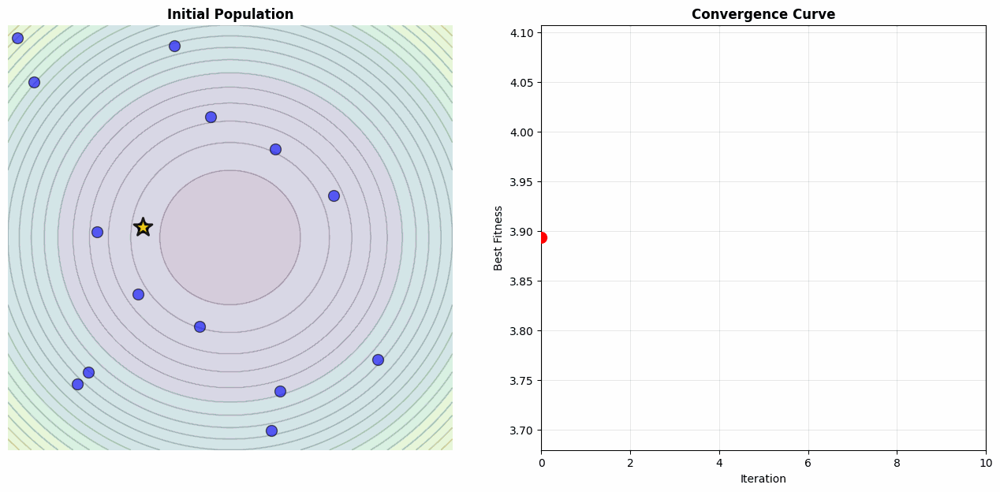

In [ ]:
# Example usage
# Define test function (Sphere function)
def sphere_function(x, y):
    return x**2 + y**2

# Create visualizer
visualizer = ABCVisualizer(
    obj_function=sphere_function,
    bounds=(-5, 5),
    colony_size=15,
    max_iter=10,
    limit=5,
    seed=42,
    resolution=100
)

# Run visualization
best_sol, best_fit = visualizer.run_visualization(fps=2)